## The definition of facial phenotypes mainly includes three processes.

### Co-variable corrections for 3D facial morphology.

Facial morphology is influenced by both genetic factors and environmental factors. correction of confounders, such as age and BMI, is to remove the variation of facial structure from confounders and to ensures the association signal from genetic efforts on face. Partial least squares regression (PLSR) was used to correct facial morphology for the confounders of sex, age, BMI and facial size.

### Facial segmentation based on the affinity matrix

We use the RV coefficient to calculate the three-dimensional correlation between each pair of vertex and construct a square affinity matrix that stores the weights between every vertex-pair. Smaller inter-vertex differences are getting higher weights. Then, the matrix is transformed into a graph Laplacian matrix, which in turn is decomposed into its k selected eigenvectors. The eigenvectors serve as new coordinates for the vertices. This operation enhances the (dis)similarities between the vertices and emphasizes the distinction between the clusters by placing the vertices into a more separable space. This relaxes the partitioning problem. In the eigenvector-space, the Euclidean distance serves as a proxy for the affinity and drives a k-means clustering to partition the vertices into k clusters.

### automatic extraction of the principal components from partial segmentation

Generalized Procrustes Analysis (GPA) was used to eliminate differences in position and orientation of each segment. Then, principal component analysis with parallel analysis was used to determine the number of significant components contributing to facial shape.

## Import

In [1]:
import netCDF4
import numpy as np
import pandas as pd
import pickle
import random

from scipy import stats
from scipy.spatial import procrustes
import sklearn.decomposition as decomp
import matplotlib.pyplot as plt
import sklearn.cluster as clt

from sklearn.cross_decomposition import PLSRegression
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples, silhouette_score

import torch
torch.cuda.set_device(2)
torch.cuda.current_device()

from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
from plotface import obj_to_mesh,plot3d,obj_data

## Read vtx and meta

In [8]:
vtx = netCDF4.Dataset('../../GWAS/data/taizhou2014_face.nc4','r')
vtx = vtx.variables['var1_1'][:].data
vtx.shape

(2659, 32251, 3)

In [22]:
vtx = vtx.reshape((2659,32251*3))

In [33]:
meta = pd.read_csv('../../GWAS/data/meta_scale.csv',index_col=0)

## PLSR

In [35]:
pls2 = PLSRegression(n_components=3)
pls2.fit(meta, vtx)

PLSRegression(copy=True, max_iter=500, n_components=3, scale=True, tol=1e-06)

In [37]:
Y_pred = pls2.predict(meta)

In [53]:
vtx_new = vtx-Y_pred

In [55]:
out_file = netCDF4.Dataset('../../GWAS/data/taizhou014_face_rmcof.nc','w',format='NETCDF4')
out_file.createDimension('x',2659)
out_file.createDimension('y',32251*3)
vars_list = out_file.createVariable('var','float32',('x','y'))
vars_list[:] = vtx_new

## RV coefficient

In [81]:
vtx_new = netCDF4.Dataset('../../GWAS/data/taizhou014_face_rmcof.nc')
vtx_new = vtx_new.variables['var'][:].data

In [82]:
vtx_new.shape

(2659, 96753)

In [95]:
vtx_new = vtx_new.reshape((2659,32251,3))

In [15]:
def rv_gpu(a,b):
    aa = torch.matmul(a,a.transpose(2,1))
    bb = torch.matmul(b,b.transpose(2,1))
    atr = aa.pow(2).sum(1).sum(1).sqrt()
    btr = bb.pow(2).sum(1).sum(1).sqrt()
    abtr = torch.matmul(aa.view(aa.shape[0],-1),bb.view(bb.shape[0],-1).transpose(1,0))
    return abtr/atr[:,None]/btr[None,:]

def vtx_rv(arr,step=500):
    n = arr.shape[0]
    rv_lst = []
    for i in range(0,n,step):
        rv = torch.cat([rv_gpu(arr[i:min(i+step,n),:,:],arr[j:min(j+step,n),:,:]) for j in range(0,n,step)],1)
        rv_lst.append(rv.cpu())
    return torch.cat(rv_lst,0)

In [19]:
vtx_t = vtx_new.transpose(1,0,2)
vtx_t=torch.from_numpy(vtx_t).cuda()

In [20]:
vtx_t.shape

torch.Size([32251, 2659, 3])

In [21]:
%time frv = vtx_rv(vtx_t,step=40)

CPU times: user 5h 36min 33s, sys: 2h 32min 55s, total: 8h 9min 28s
Wall time: 8h 25min 10s


In [22]:
frv = frv.cpu().numpy()

In [26]:
np.save('../../GWAS/data/taizhou2014_all_rmcof_rvcoef.npy',frv)

In [4]:
frv = np.load('../../GWAS/data/taizhou2014_all_rmcof_rvcoef.npy')

(array([2.85504968e+08, 3.83934812e+08, 1.88186122e+08, 7.31590420e+07,
        4.03983910e+07, 2.73950770e+07, 1.71827890e+07, 1.14887780e+07,
        8.35304200e+06, 4.52398000e+06]),
 array([5.4587849e-04, 1.0049184e-01, 2.0043780e-01, 3.0038375e-01,
        4.0032971e-01, 5.0027567e-01, 6.0022163e-01, 7.0016760e-01,
        8.0011356e-01, 9.0005952e-01, 1.0000055e+00], dtype=float32),
 <a list of 10 Patch objects>)

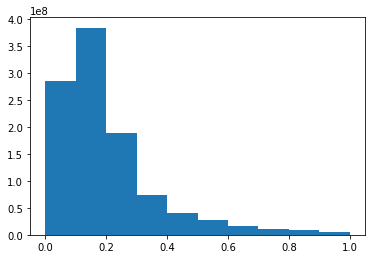

In [24]:
plt.hist(frv.ravel())

## Facial segmentation

In [2]:
face = np.loadtxt('../../GWAS/data/E0001_g.vtx')

In [6]:
Xn = frv.copy()

In [7]:
Xn[Xn>1]=1.0

In [26]:
Dsqrt = np.sqrt(Xn.sum(1))
Xn = Xn / Dsqrt[:,None] /Dsqrt[None,:]

In [27]:
pca1 = PCA(n_components=50)
pca1.fit(Xn)

PCA(copy=True, iterated_power='auto', n_components=50, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

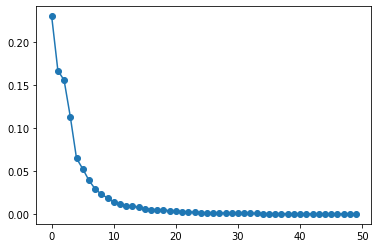

In [29]:
plt.plot(pca1.explained_variance_ratio_,'o-')

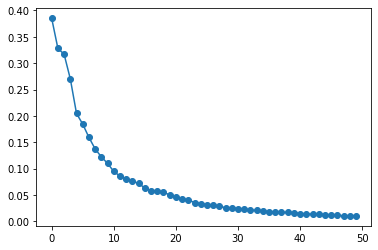

In [30]:
plt.plot(pca1.singular_values_,'o-')

In [55]:
Vn = pca1.components_.T

In [56]:
Vn = Vn - Vn.mean(axis=0)
Vn = Vn/Vn.ptp(axis=0)

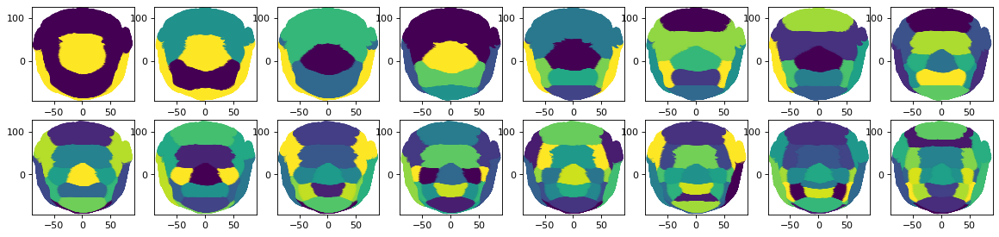

In [79]:
SSE = []
scl_in = []
silhouette_avg = []
plt.figure(figsize=(18, 4), dpi= 80, facecolor='w', edgecolor='k')
for k in range(2,18):
    scl1 = clt.KMeans(n_clusters=k,random_state=0).fit(Vn[:,:11])
    silhouette_avg.append(silhouette_score(Vn[:,:11],scl1.labels_))
    
    scl_in.append(scl1.labels_)
    SSE.append(scl1.inertia_)
    plt.subplot(2,8,k-1)
    plt.scatter(face[:,0],face[:,1],c=scl1.labels_)
plt.show()

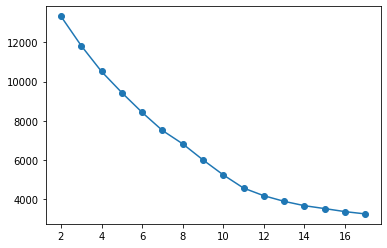

In [85]:
plt.plot(range(2,18),SSE,'o-')

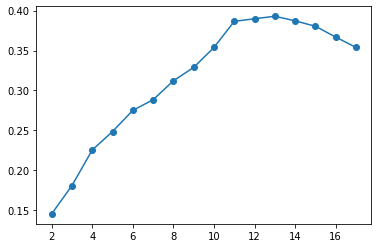

In [86]:
plt.plot(range(2,18),silhouette_avg,'o-')

## Plot

In [2]:
scl_in = np.load('../impute2_examples/data/phenotype/scl_in_kmean.npy')

In [3]:
vertices, faces = obj_to_mesh(obj_data)

In [4]:
plot3d(vertices,scl_in[8],faces)

## GPA

In [5]:
plot3d(vertices,scl_in[8]==9,faces)

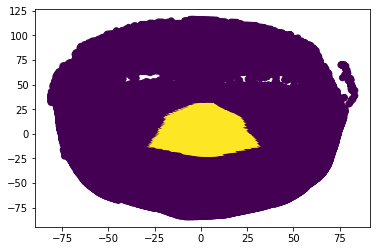

In [94]:
plt.scatter(face[:,0],face[:,1],c=scl_in[8]==9)

In [139]:
pd.Series(scl_in[8]).value_counts()

2    5205
8    4369
4    3691
1    3205
6    3123
0    2956
7    2933
3    2532
5    2267
9    1970
dtype: int64

In [141]:
for i in range(9):
    seg=vtx_new[:,scl_in[8]==i,:]
    a = seg[1733]
    prc = [procrustes(a,b) for b in seg]
    seg_prc = [p[1] for p in prc]
    seg_prc = np.stack(seg_prc)
    print(seg_prc.shape)
    seg_prc = seg_prc.reshape((2659,-1))
    np.savetxt("../impute2_examples/data/phenotype/seg"+str(i)+"_prc.csv",seg_prc,delimiter=',')

(2659, 2956, 3)
(2659, 3205, 3)
(2659, 5205, 3)
(2659, 2532, 3)
(2659, 3691, 3)
(2659, 2267, 3)
(2659, 3123, 3)
(2659, 2933, 3)
(2659, 4369, 3)
